In [1]:
import pandas as pd
import numpy as np

from autots import AutoTS

from neuralprophet import NeuralProphet, set_log_level

# Disable logging messages unless there is an error
set_log_level("ERROR")

import matplotlib as mpl
import matplotlib.pyplot as plt   # data visualization
import seaborn as sns             # statistical data visualization
import plotly.express as px
import plotly.graph_objects as go
%matplotlib inline

import pickle

import warnings
warnings.filterwarnings('ignore')

C:\Users\Tony\anaconda3\lib\site-packages\torchvision\io\image.py:13: UserWarning: Failed to load image Python extension: '[WinError 127] 지정된 프로시저를 찾을 수 없습니다'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(


In [2]:
# encoding = 'CP949'
filename = 'gasoline_price.csv'
filename1 = 'brent_price.csv'
data = pd.read_csv(filename)
data_brent = pd.read_csv(filename1)

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5708 entries, 0 to 5707
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   구분      5708 non-null   object 
 1   서울      5708 non-null   float64
dtypes: float64(1), object(1)
memory usage: 89.3+ KB


In [3]:
data_brent.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4037 entries, 0 to 4036
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   기간      4037 non-null   object 
 1   Brent   4029 non-null   float64
dtypes: float64(1), object(1)
memory usage: 63.2+ KB


## 2. Data Preparation

Gasoline data

In [4]:
"""Date format preprocessing"""
char_replace = ['년', '월']

for char in char_replace:
    data['구분'] = data['구분'].str.replace(char, '-')

data['구분'] = data['구분'].str.replace('일', '')
#data['구분'] = data['구분'].str[:-1]

data.rename({'구분':'Day'}, axis=1, inplace = True)

data['Date'] = pd.to_datetime(data['Day'], errors='coerce', format='%Y-%m-%d')

data.set_index('Date', inplace=True)
data.sort_index(inplace=True)

data.reset_index(inplace=True)

data = data.drop('Day', axis = 1)

In [5]:
"""Drop last row of Gasoline data to match the data"""
data = data[:-1]

Brent data

In [6]:
'''Change date format of Brent oil data to yyyy-mm-dd'''
data_brent['기간'] = '20' + data_brent.loc[:,'기간']

In [7]:
char_replace = ['년', '월']

for char in char_replace:
    data_brent['기간'] = data_brent['기간'].str.replace(char, '-')

data_brent['기간'] = data_brent['기간'].str.replace('일', '')
#data['구분'] = data['구분'].str[:-1]

data_brent.rename({'기간':'Day'}, axis=1, inplace = True)

data_brent['Date'] = pd.to_datetime(data_brent['Day'], errors='coerce',
                              format='%Y-%m-%d')

data_brent.set_index('Date', inplace=True)
data_brent.sort_index(inplace=True)

data_brent.reset_index(inplace=True)

data_brent = data_brent.drop('Day', axis = 1)

In [8]:
# using the resample method
data_brent.set_index(data_brent.Date, inplace=True)
data_brent = data_brent.resample('D').sum().fillna(0)
data_brent.reset_index(inplace=True)

In [9]:
data.info

<bound method DataFrame.info of            Date       서울
0    2008-04-15  1734.58
1    2008-04-16  1749.97
2    2008-04-17  1744.71
3    2008-04-18  1748.01
4    2008-04-19  1748.87
...         ...      ...
5702 2023-11-25  1730.41
5703 2023-11-26  1729.95
5704 2023-11-27  1730.44
5705 2023-11-28  1727.37
5706 2023-11-29  1723.48

[5707 rows x 2 columns]>

In [10]:
data_brent.info

<bound method DataFrame.info of            Date   Brent
0    2008-04-15  111.31
1    2008-04-16  112.66
2    2008-04-17  112.43
3    2008-04-18  113.92
4    2008-04-19    0.00
...         ...     ...
5702 2023-11-25    0.00
5703 2023-11-26    0.00
5704 2023-11-27   79.98
5705 2023-11-28   81.68
5706 2023-11-29   83.10

[5707 rows x 2 columns]>

- Changing currency(USD to KRW)

In [11]:
print(data_brent.isnull().sum())

Date     0
Brent    0
dtype: int64


- Replace 0 data(weekend data) with previous non zero values in Brent oil Price

In [12]:
data_brent['Brent'] = data_brent['Brent'].replace(to_replace=0, method='ffill')

In [13]:
 0 in data_brent.values

False

- Rename Gasoline Price data

In [14]:
data.rename(columns = {'서울' : 'Gasoline'}, inplace=True)

In [15]:
data.head(3)

,Date,Gasoline
0,2008-04-15,1734.58
1,2008-04-16,1749.97
2,2008-04-17,1744.71


In [16]:
data_brent.head(3)

,Date,Brent
0,2008-04-15,111.31
1,2008-04-16,112.66
2,2008-04-17,112.43


## 3. EDA

In [17]:
print(data.isnull().sum())

Date        0
Gasoline    0
dtype: int64


In [18]:
print(data_brent.isnull().sum())

Date     0
Brent    0
dtype: int64


### Visualization (Gasoline)

In [19]:
fig = px.line(data, x='Date', y='Gasoline', title = 'Gasoline Prices of Seoul by Year',
              labels = {
                  "Date" : "Year",
                  "Gasoline" : "Gasoline Price (won)"
              },
              template = 'plotly_dark')
fig.show()

In [20]:
fig = px.histogram(data, x='Gasoline', 
                   title = 'Gasoline Prices of Seoul',
                   labels = {
                  "Gasoline" : "Gasoline Price (won)"
                   },
                   template = 'plotly_dark')
fig.show()

Text(0.5, 0, 'Date')

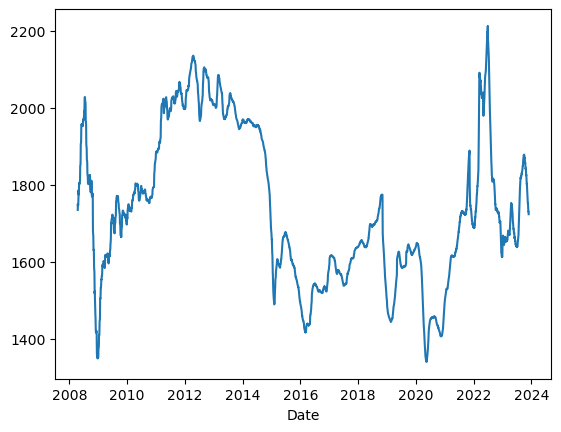

In [21]:
plt.plot(data['Date'], data.loc[:, data.columns != 'Date'])
plt.xlabel("Date")

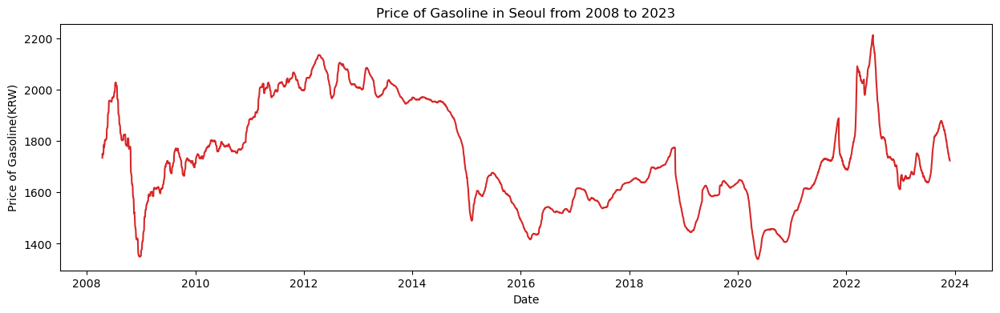

In [22]:
#dpi = 100
plt.figure(figsize=(15,4))#, dpi=dpi)
plt.plot(data['Date'], data['Gasoline'], color='tab:red')
plt.xlabel('Date')
plt.ylabel('Price of Gasoline(KRW)')
plt.title('Price of Gasoline in Seoul from 2008 to 2023')
         
plt.show()

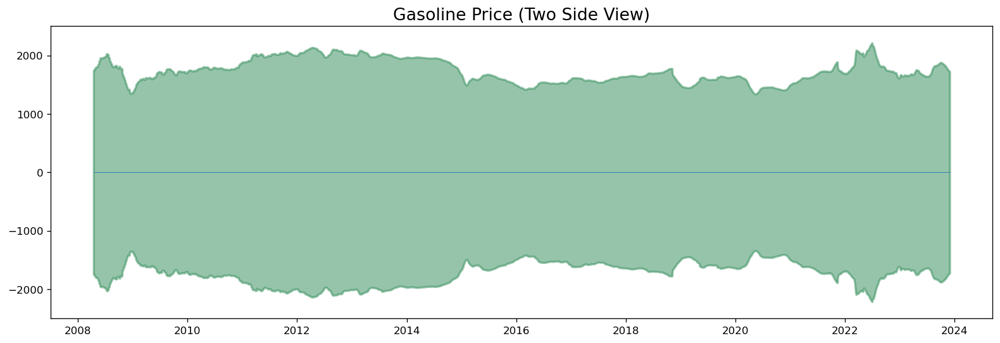

In [23]:
x = data['Date'].values
y1 = data['Gasoline'].values

# Plot
fig, ax = plt.subplots(1, 1, figsize=(16,5), dpi= 120)
plt.fill_between(x, y1=y1, y2=-y1, alpha=0.5, linewidth=2, color='seagreen')
plt.ylim(-2500, 2500)
plt.title('Gasoline Price (Two Side View)', fontsize=16)
plt.hlines(y=0, xmin=np.min(data['Date']), xmax=np.max(data['Date']), linewidth=.5)
plt.show()

### Visualization (Brent oil)

In [24]:
fig = px.line(data_brent, x='Date', y='Brent', title = 'Brent oil Prices',
              labels = {
                  "Date" : "Year",
                  "Brent" : "Brent oil Price (usd)"
              },
              template = 'plotly_dark')
fig.show()

In [25]:
fig = px.histogram(data_brent, x='Brent', 
                   title = 'Brent oil Price',
                   labels = {
                  "Brent" : "Brent oil Price (usd)"
                   },
                   template = 'plotly_dark')
fig.show()

Text(0.5, 0, 'Date')

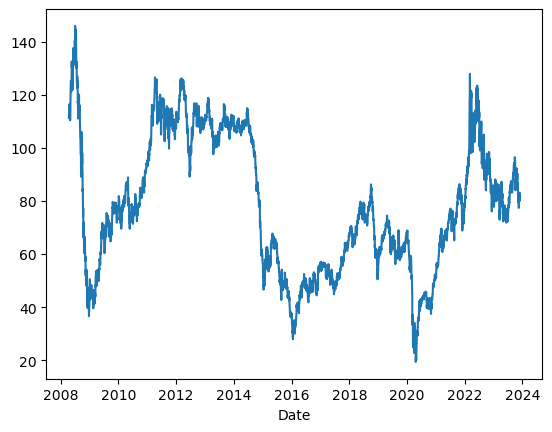

In [26]:
plt.plot(data_brent['Date'], data_brent.loc[:, data_brent.columns != 'Date'])
plt.xlabel("Date")

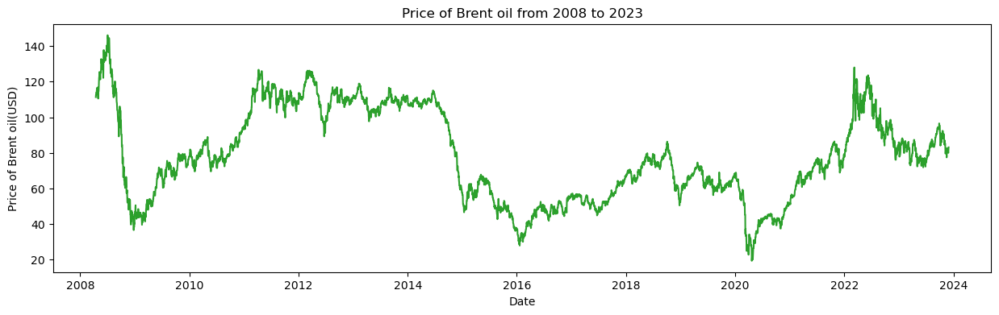

In [27]:
#dpi = 100
plt.figure(figsize=(15,4))#, dpi=dpi)
plt.plot(data_brent['Date'], data_brent['Brent'], color='tab:green')
plt.xlabel('Date')
plt.ylabel('Price of Brent oil(USD)')
plt.title('Price of Brent oil from 2008 to 2023')
         
plt.show()

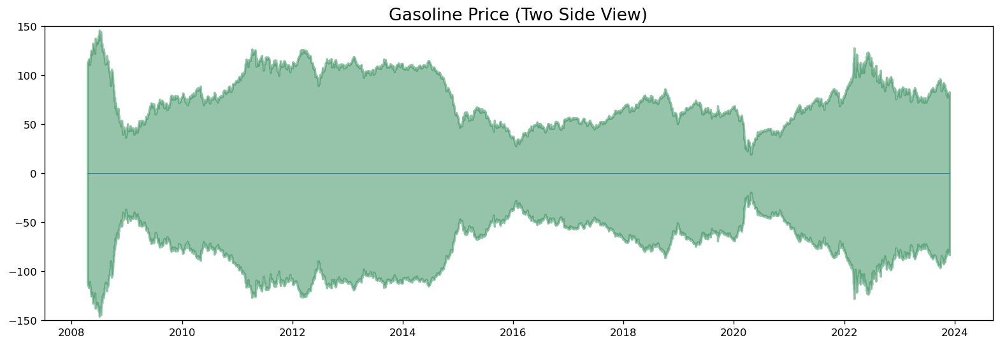

In [28]:
x = data_brent['Date'].values
y1 = data_brent['Brent'].values

# Plot
fig, ax = plt.subplots(1, 1, figsize=(16,5), dpi= 120)
plt.fill_between(x, y1=y1, y2=-y1, alpha=0.5, linewidth=2, color='seagreen')
plt.ylim(-150, 150)
plt.title('Gasoline Price (Two Side View)', fontsize=16)
plt.hlines(y=0, xmin=np.min(data['Date']), xmax=np.max(data['Date']), linewidth=.5)
plt.show()

##### Heatmap (Gasoline)

In [29]:
data['year'] = data['Date'].dt.year
data['month'] = data['Date'].dt.month
data['day'] = data['Date'].dt.day

In [30]:
data.head(3)

,Date,Gasoline,year,month,day
0,2008-04-15,1734.58,2008,4,15
1,2008-04-16,1749.97,2008,4,16
2,2008-04-17,1744.71,2008,4,17


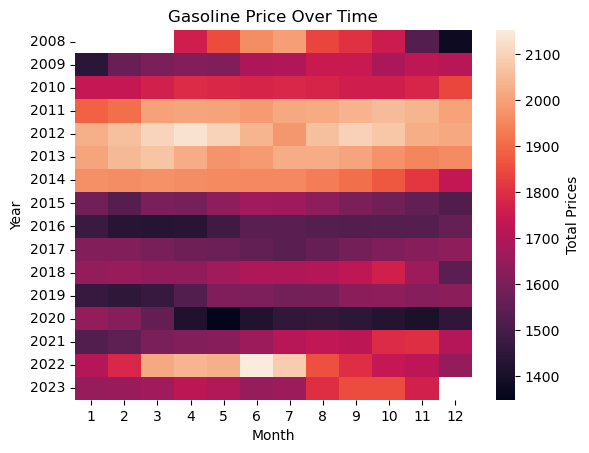

In [31]:
# re-format the data for the heat-map
price_month_year = data.pivot_table(index="year", columns="month", values="Gasoline", aggfunc='mean')

# create heatmap
sns.heatmap(price_month_year, cbar_kws={"label": "Total Prices"})
plt.title("Gasoline Price Over Time")
plt.xlabel("Month")
plt.ylabel("Year")
plt.show()

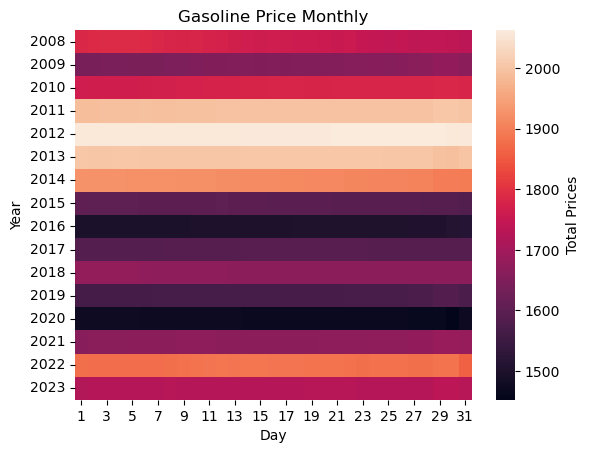

In [32]:
# re-format the data for the heat-map
price_month_day = data.pivot_table(index="year", columns="day", values="Gasoline", aggfunc='mean')

# create heatmap
sns.heatmap(price_month_day, cbar_kws={"label": "Total Prices"})
plt.title("Gasoline Price Monthly")
plt.xlabel("Day")
plt.ylabel("Year")
plt.show()

연도별 가격이 어느 정도였는지 대략 알 수 있다.

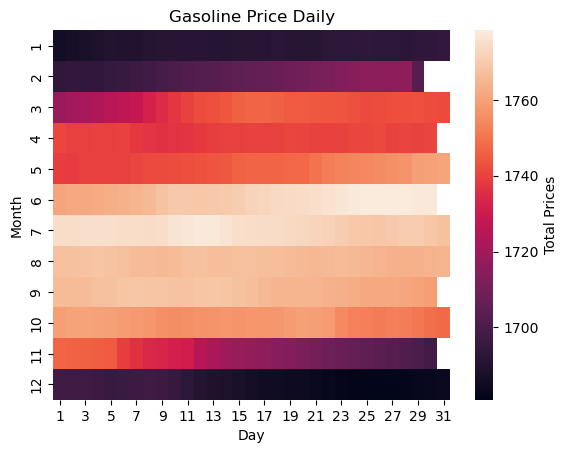

In [33]:
# re-format the data for the heat-map
price_month_day = data.pivot_table(index="month", columns="day", values="Gasoline", aggfunc='mean')

# create heatmap
sns.heatmap(price_month_day, cbar_kws={"label": "Total Prices"})
plt.title("Gasoline Price Daily")
plt.xlabel("Day")
plt.ylabel("Month")
plt.show()

겨울에는 비교적 가격이 하락하고 여름과 가을에 가격이 상승하는 경향을 볼 수 있다.

#### Heatmap (Brent oil)

In [34]:
data_brent['year'] = data_brent['Date'].dt.year
data_brent['month'] = data_brent['Date'].dt.month
data_brent['day'] = data_brent['Date'].dt.day

In [35]:
data_brent.head(3)

,Date,Brent,year,month,day
0,2008-04-15,111.31,2008,4,15
1,2008-04-16,112.66,2008,4,16
2,2008-04-17,112.43,2008,4,17


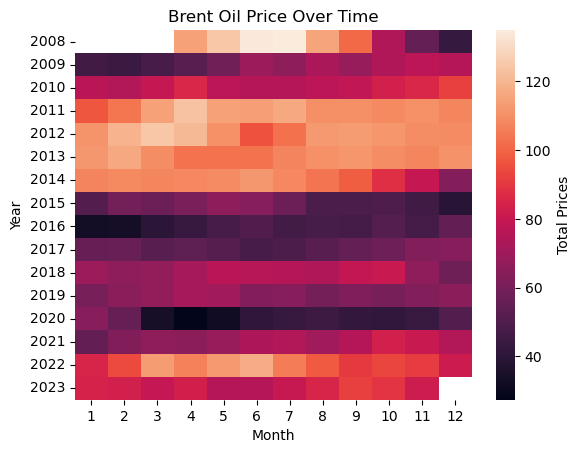

In [36]:
# re-format the data for the heat-map
price_month_year = data_brent.pivot_table(index="year", columns="month", values="Brent", aggfunc='mean')

# create heatmap
sns.heatmap(price_month_year, cbar_kws={"label": "Total Prices"})
plt.title("Brent Oil Price Over Time")
plt.xlabel("Month")
plt.ylabel("Year")
plt.show()

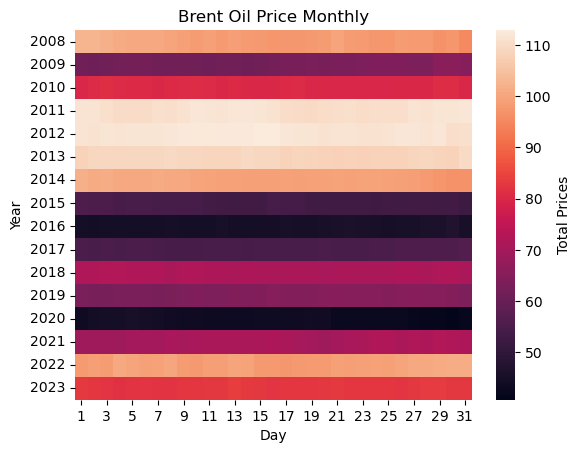

In [37]:
# re-format the data for the heat-map
price_month_day = data_brent.pivot_table(index="year", columns="day", values="Brent", aggfunc='mean')

# create heatmap
sns.heatmap(price_month_day, cbar_kws={"label": "Total Prices"})
plt.title("Brent Oil Price Monthly")
plt.xlabel("Day")
plt.ylabel("Year")
plt.show()

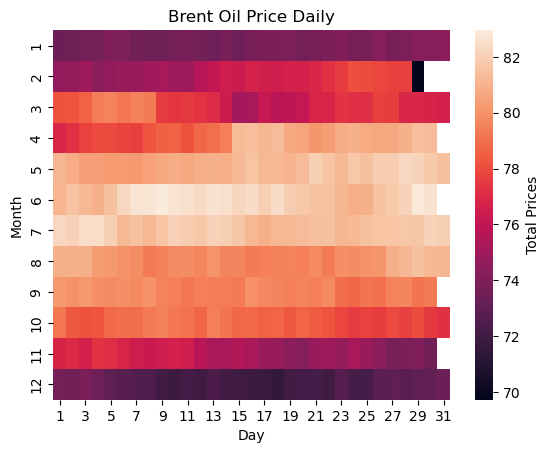

In [38]:
# re-format the data for the heat-map
price_month_day = data_brent.pivot_table(index="month", columns="day", values="Brent", aggfunc='mean')

# create heatmap
sns.heatmap(price_month_day, cbar_kws={"label": "Total Prices"})
plt.title("Brent Oil Price Daily")
plt.xlabel("Day")
plt.ylabel("Month")
plt.show()

In [39]:
data1 = data[["Date", "Gasoline"]]
data1.set_index('Date', inplace = True)
dataB = data_brent[["Date", "Brent"]]
dataB.set_index('Date', inplace = True)

In [40]:
data1.head(3)

,Gasoline
Date,
2008-04-15,1734.58
2008-04-16,1749.97
2008-04-17,1744.71


In [41]:
dataB.head(3)

,Brent
Date,
2008-04-15,111.31
2008-04-16,112.66
2008-04-17,112.43


In [42]:
# 1USD = 1,300KRW
# 1Barrel = 159liters
'''Change date format of Brent oil data to yyyy-mm-dd'''
dataB['Brent(krw)'] = float(1300) * dataB.loc[:,'Brent']

In [43]:
# 1 Brent = 83 Gasoline

In [44]:
#data1['Gasoline'] = np.log(data1['Gasoline'])

In [45]:
dataB = dataB.drop('Brent', axis = 1)

In [46]:
dataB.head(3)

,Brent(krw)
Date,
2008-04-15,144703.0
2008-04-16,146458.0
2008-04-17,146159.0


<Axes: xlabel='Date'>

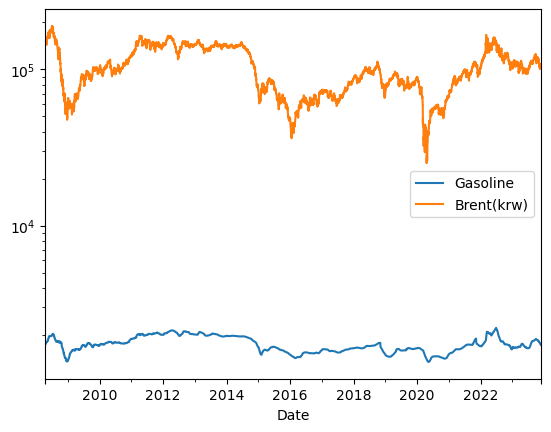

In [47]:
ax = data1.plot()
ax.set(yscale = 'log')
dataB.plot(ax=ax)

##### Lag scatter plot

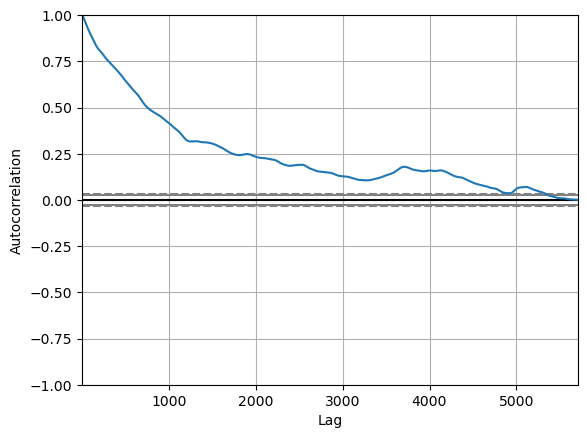

In [48]:
# import autocorrelation function
from pandas.plotting import autocorrelation_plot

year_data = data[['year', 'Gasoline']]

# autocorrelation plot
autocorrelation_plot(year_data)
plt.show()

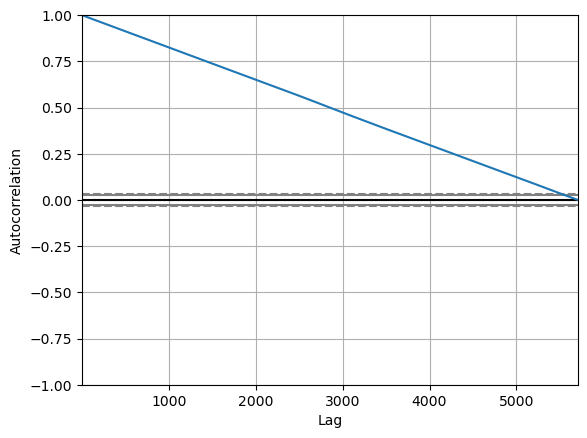

In [49]:
year_dataB = data_brent[['year', 'Brent']]

# autocorrelation plot
autocorrelation_plot(year_dataB)
plt.show()

## Decomposition of a Time Series

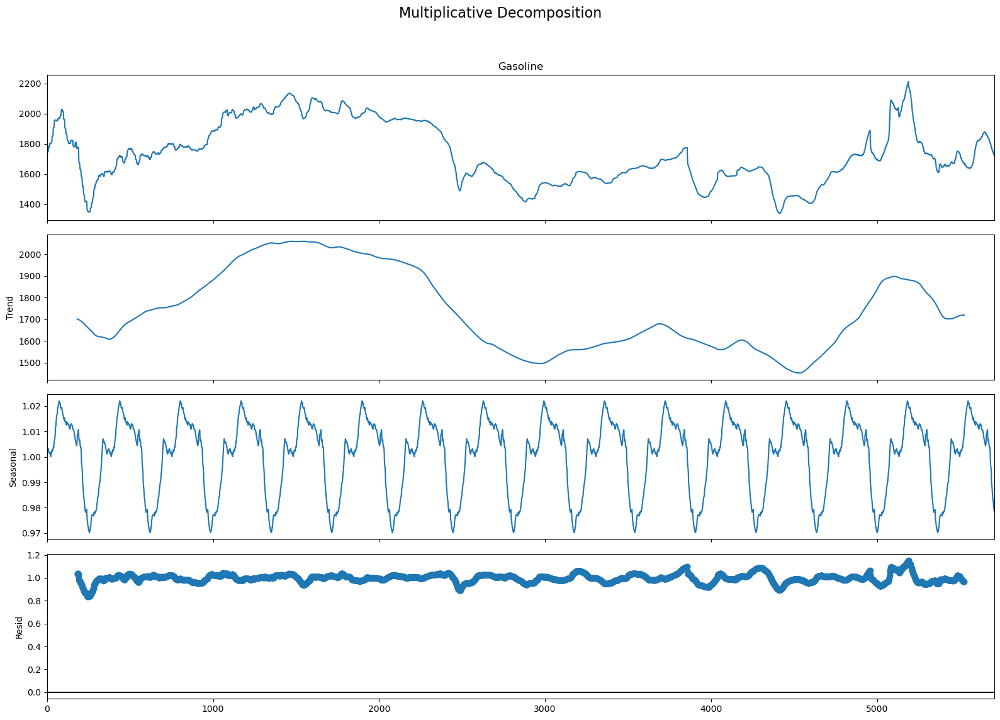

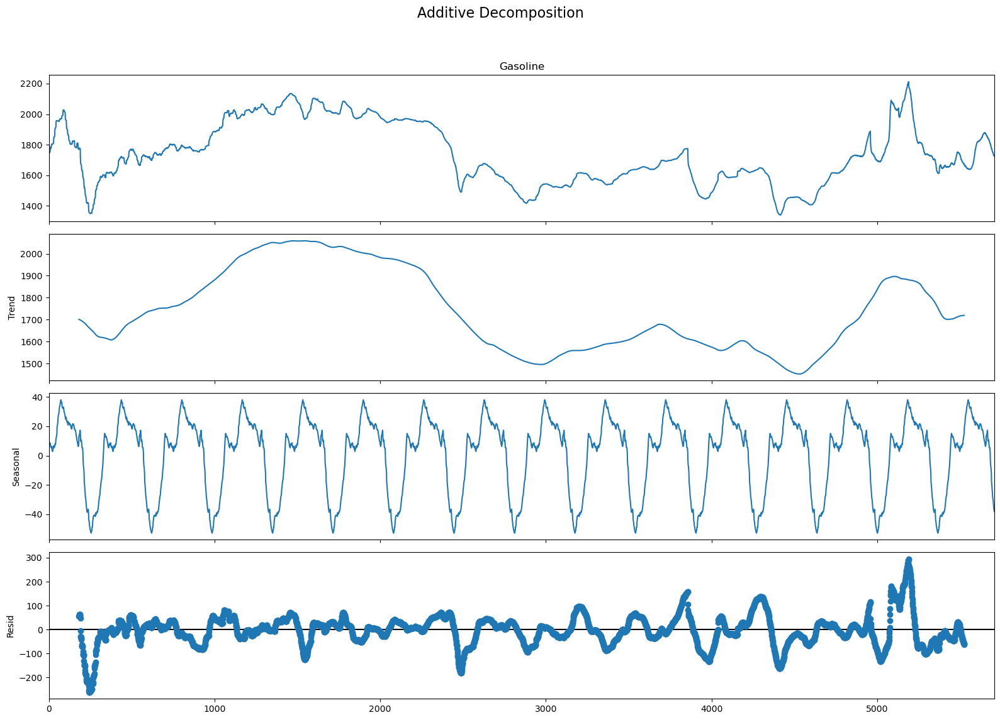

In [50]:
from statsmodels.tsa.seasonal import seasonal_decompose
from dateutil.parser import parse


# Multiplicative Decomposition 
multiplicative_decomposition = seasonal_decompose(data['Gasoline'], model='multiplicative', period=365)

# Additive Decomposition
additive_decomposition = seasonal_decompose(data['Gasoline'], model='additive', period=365)

# Plot
plt.rcParams.update({'figure.figsize': (16,12)})
multiplicative_decomposition.plot().suptitle('Multiplicative Decomposition', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

additive_decomposition.plot().suptitle('Additive Decomposition', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

plt.show()

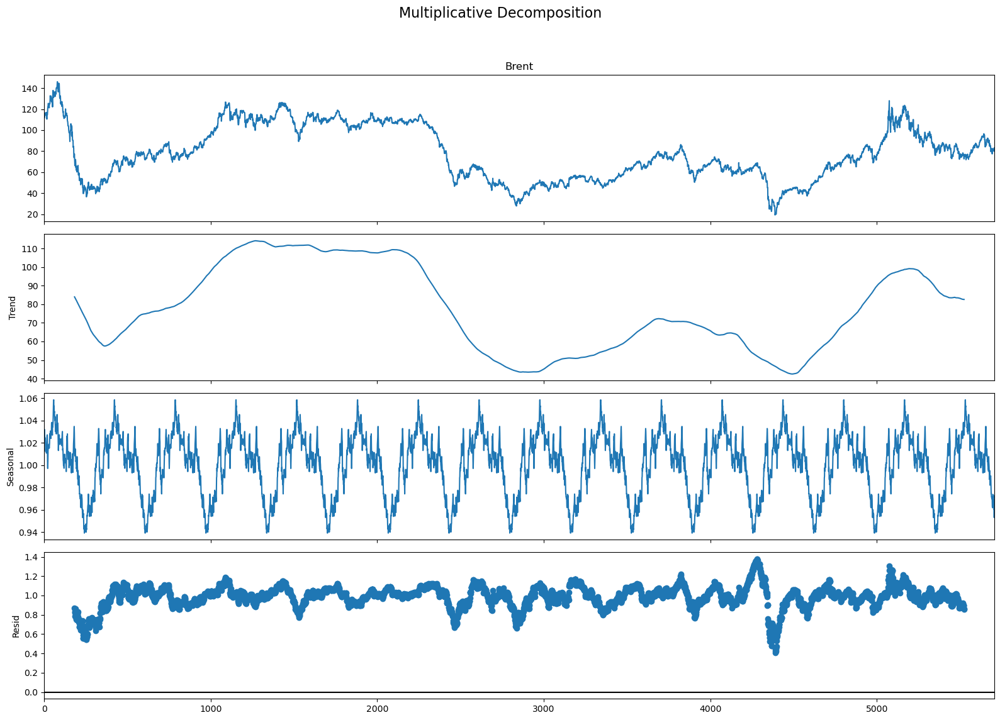

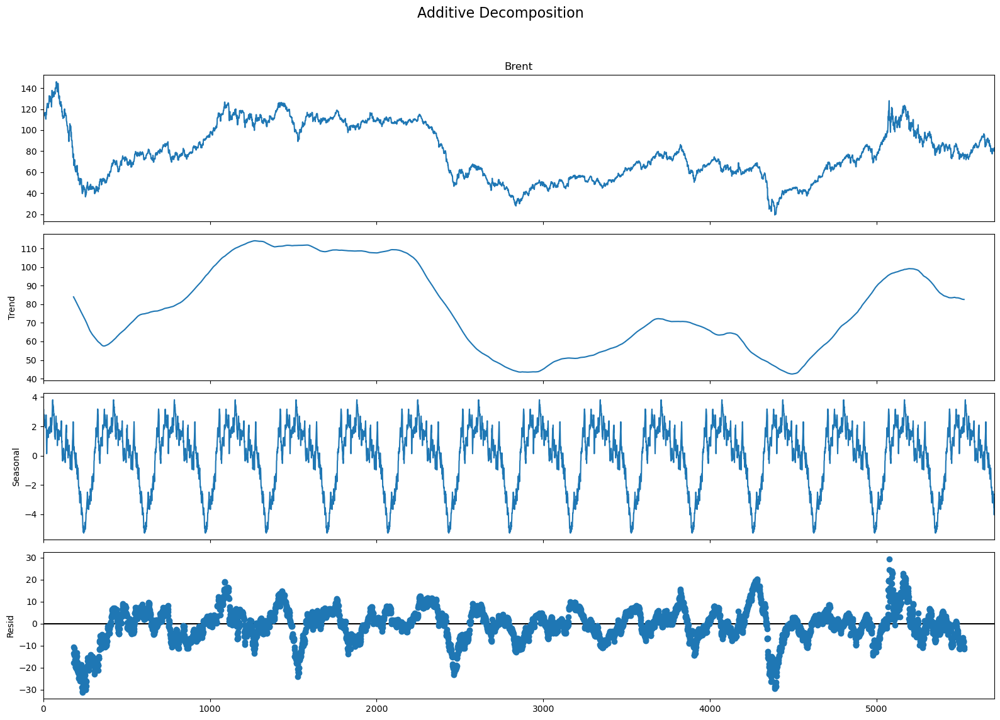

In [51]:
# Multiplicative Decomposition 
multiplicative_decomposition = seasonal_decompose(data_brent['Brent'], model='multiplicative', period=365)

# Additive Decomposition
additive_decomposition = seasonal_decompose(data_brent['Brent'], model='additive', period=365)

# Plot
plt.rcParams.update({'figure.figsize': (16,12)})
multiplicative_decomposition.plot().suptitle('Multiplicative Decomposition', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

additive_decomposition.plot().suptitle('Additive Decomposition', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

plt.show()

In [52]:
from statsmodels.tsa.stattools import adfuller

def adf_test(data):
    result = adfuller(data.values)
    print('ADF Statistics: %f' % result[0])
    print('p-value: %f' % result[1])
    print('num of lags: %f' % result[2])
    print('num of observations: %f' % result[3])
    print('Critical values:')
    for k, v in result[4].items():
        print('\t%s: %.3f' % (k,v))

print('ADF TEST 결과')
adf_test(data['Gasoline'])

ADF TEST 결과
ADF Statistics: -2.812807
p-value: 0.056468
num of lags: 22.000000
num of observations: 5684.000000
Critical values:
	1%: -3.432
	5%: -2.862
	10%: -2.567


In [53]:
print('ADF TEST 결과')
adf_test(data_brent['Brent'])

ADF TEST 결과
ADF Statistics: -2.233739
p-value: 0.194229
num of lags: 7.000000
num of observations: 5699.000000
Critical values:
	1%: -3.431
	5%: -2.862
	10%: -2.567


P value is 0.0572, which is greater than 0.05.
<br>
Thus, It is not significant, which means the data is $Non-Stationary$.
<br>
Although I doubt that this value means significant.

## Stationary and Non-Stationary Time Series

In [54]:
data.head(3)

,Date,Gasoline,year,month,day
0,2008-04-15,1734.58,2008,4,15
1,2008-04-16,1749.97,2008,4,16
2,2008-04-17,1744.71,2008,4,17


In [55]:
data.columns

Index(['Date', 'Gasoline', 'year', 'month', 'day'], dtype='object')

In [56]:
new_data = data[['Date', "Gasoline"]]
new_data.set_index("Date", inplace=True)

In [57]:
new_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 5707 entries, 2008-04-15 to 2023-11-29
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Gasoline  5707 non-null   float64
dtypes: float64(1)
memory usage: 89.2 KB


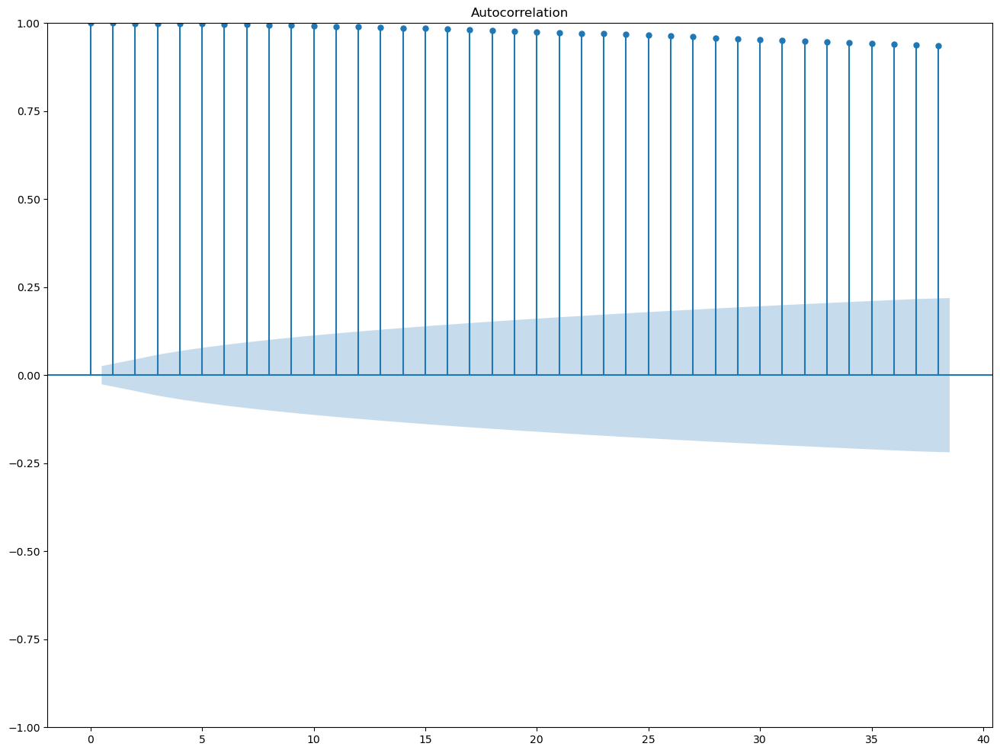

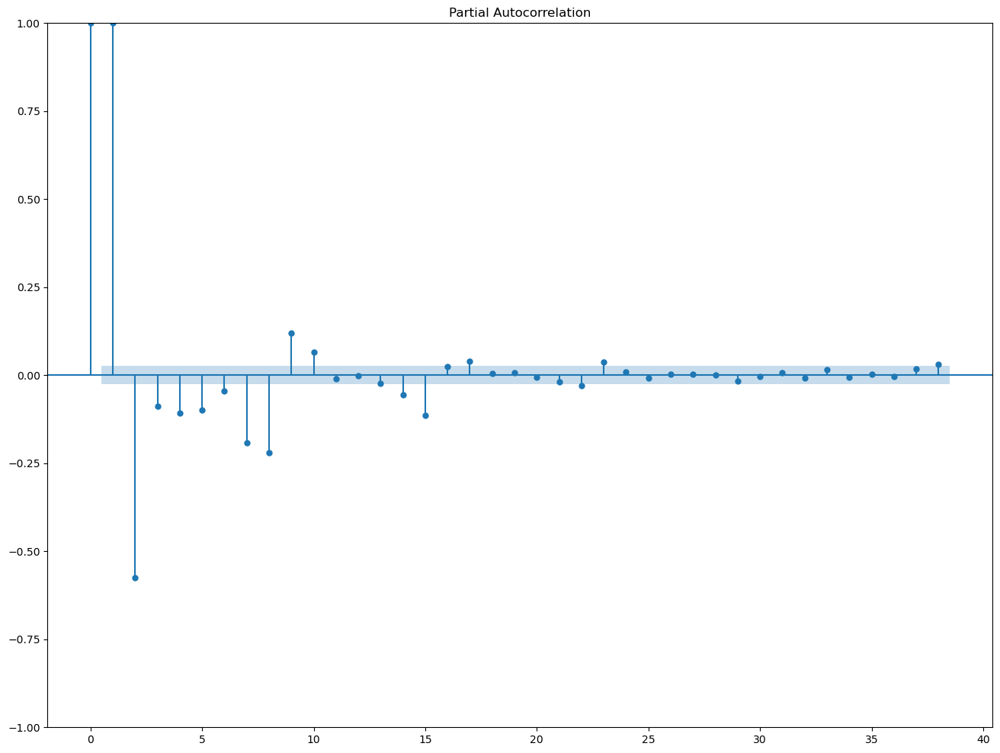

In [58]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

plot_acf(new_data)
plot_pacf(new_data)
plt.show()

ACF plot가 천천히 감소되는 것으로 보아 주식 데이터는 주기에 따라 일정하지 않은 비정상성 데이터이고,
<br>
PACF plot에서 첫값으로부터 1개 이후 파란 박스에 들어가면서 그래프가 끊기는 것으로 보아 AR(1) 모델을 활용하는 것이 가장 적절할 것으로 예상된다.

## NeuralProphet

In [59]:
gasoline = data[["Date", "Gasoline"]]

In [60]:
gasoline.rename(columns = {'Date':'ds', 'Gasoline':'y'}, inplace = True)

In [63]:
brent = data_brent[["Date", "Brent"]]
brent.rename(columns = {'Date':'ds'}, inplace = True)
#brent = brent.drop("Date", axis=1)

In [65]:
df_merged = pd.merge(gasoline, brent, on='ds', how='inner')

In [67]:
# df_merged = pd.concat([gasoline, brent], axis=1)

In [70]:
neural = gasoline.reset_index(drop=True)

In [71]:
neural

,ds,y
0,2008-04-15,1734.58
1,2008-04-16,1749.97
2,2008-04-17,1744.71
3,2008-04-18,1748.01
4,2008-04-19,1748.87
...,...,...
5702,2023-11-25,1730.41
5703,2023-11-26,1729.95
5704,2023-11-27,1730.44
5705,2023-11-28,1727.37


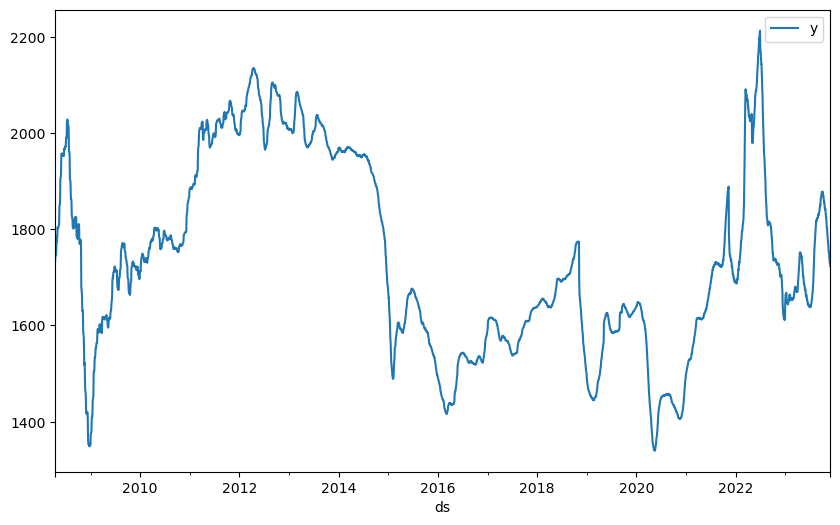

In [72]:
fig = neural.plot(x="ds", y=["y"], figsize=(10, 6))

### 1. Train
- simple prophet
- a few year ago you had to set epoch, but now it automatically selects

In [73]:
m = NeuralProphet(quantiles=[0.05, 0.95],
                  yearly_seasonality="auto",
                  weekly_seasonality="auto",
                  daily_seasonality="auto",
                  optimizer = 'SGD')

m.set_plotting_backend("plotly")  # show plots correctly in jupyter notebooks
# m.add_lagged_regressor("Brent")
metrics = m.fit(neural)

Finding best initial lr:   0%|          | 0/244 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

In [74]:
forecast = m.predict(neural)

Predicting: 179it [00:00, ?it/s]

In [85]:
fig1 = m.plot(forecast)
fig1

This is a simple model with a trend, a weekly seasonality and a yearly seasonality estimated by default. You can also look at the individual components separately as below.

In [76]:
m.plot_components(forecast)

In [77]:
m.plot_parameters()

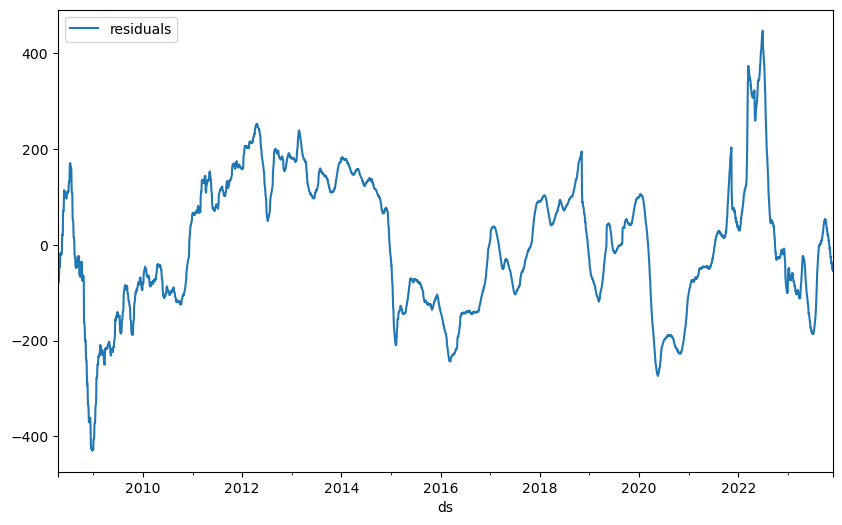

In [78]:
df_residuals = pd.DataFrame({"ds": neural["ds"], "residuals": neural["y"] - forecast["yhat1"]})
fig = df_residuals.plot(x="ds", y="residuals", figsize=(10, 6))

### 2. Forecast Away

In [80]:
metrics

,MAE,RMSE,Loss,RegLoss,epoch
0,426.733124,524.935547,0.415718,0.0,0
1,377.642883,463.281982,0.332370,0.0,1
2,325.078369,397.135315,0.246715,0.0,2
3,276.122803,333.183899,0.171011,0.0,3
4,240.558456,286.483978,0.122343,0.0,4
...,...,...,...,...,...
114,117.532120,139.491272,0.017523,0.0,114
115,117.571838,139.728729,0.017525,0.0,115
116,117.620964,139.619751,0.017538,0.0,116
117,117.558083,139.461258,0.017538,0.0,117


In [97]:
future = m.make_future_dataframe(neural, periods = 1095)
forecast1 = m.predict(future)
forecast1.head()

Predicting: 179it [00:00, ?it/s]

,ds,y,yhat1,yhat1 5.0%,yhat1 95.0%,trend,season_yearly,season_weekly
0,2023-11-30,None,1776.186523,1640.641357,1949.715698,1812.659546,-36.569759,0.096727
1,2023-12-01,None,1775.045166,1638.929077,1948.402588,1812.818726,-37.781643,0.008151
2,2023-12-02,None,1773.655396,1637.152710,1947.354126,1812.978027,-38.930359,-0.392299
3,2023-12-03,None,1772.729736,1635.914307,1946.613037,1813.137451,-40.013458,-0.394217
4,2023-12-04,None,1772.056885,1634.485352,1946.436523,1813.296631,-41.028889,-0.210847


In [98]:
forecast1.tail()

,ds,y,yhat1,yhat1 5.0%,yhat1 95.0%,trend,season_yearly,season_weekly
1090,2026-11-24,None,1958.193848,1847.805786,2178.966553,1986.276855,-28.538706,0.455654
1091,2026-11-25,None,1956.824707,1845.855347,2177.397949,1986.436035,-30.048174,0.436830
1092,2026-11-26,None,1955.176758,1843.706543,2175.490234,1986.595337,-31.515354,0.096727
1093,2026-11-27,None,1953.826904,1841.711426,2173.718018,1986.754639,-32.935902,0.008151
1094,2026-11-28,None,1952.215820,1839.636353,2172.193604,1986.913818,-34.305740,-0.392299


In [99]:
fig2 = m.plot(forecast1)
fig2

In [100]:
fig = go.Figure(data = fig1.data + fig2.data)
fig.show()

In [101]:
forecast1['yhat1'].astype(int)

0       1776
1       1775
2       1773
3       1772
4       1772
        ... 
1090    1958
1091    1956
1092    1955
1093    1953
1094    1952
Name: yhat1, Length: 1095, dtype: int32

In [102]:
results_df = forecast1[['ds', 'yhat1', 'yhat1 5.0%', 'yhat1 95.0%']]
results_df['yhat1'] = forecast1['yhat1'].astype(int)
results_df['yhat1 5.0%'] = forecast1['yhat1 5.0%'].astype(int)
results_df['yhat1 95.0%'] = forecast1['yhat1 95.0%'].astype(int)
results_df.columns = ['Date', 'Predicted Price', 'Predicted Price 5.0%', 'Predicted Price 95%']

In [103]:
results_df

,Date,Predicted Price,Predicted Price 5.0%,Predicted Price 95%
0,2023-11-30,1776,1640,1949
1,2023-12-01,1775,1638,1948
2,2023-12-02,1773,1637,1947
3,2023-12-03,1772,1635,1946
4,2023-12-04,1772,1634,1946
...,...,...,...,...
1090,2026-11-24,1958,1847,2178
1091,2026-11-25,1956,1845,2177
1092,2026-11-26,1955,1843,2175
1093,2026-11-27,1953,1841,2173


In [107]:
results_df.to_csv("results", encoding='utf-8', index=False)

### 2-1. Validation

### 3. Save Model

In [105]:
with open("forecast_model.pki", "wb") as f:
    pickle.dump(m, f)

In [106]:
m

In [ ]:
del m

In [ ]:
with open("forecast_model.pki", "rb") as f:
    m = pickle.load(f)

In [ ]:
m

In [ ]:
future = m.make_future_dataframe(neural, periods = 12000)
forecast = m.predict(future)
forecast.head()

In [ ]:
forecast.tail()

In [ ]:
m.plot(forecast)

---

### 1-1. Sophisticated Train
The individual coefficient values can also be plotted as below to gain further insights.

In [ ]:
m = NeuralProphet(n_lags=10, quantiles=[0.05, 0.95])
m.set_plotting_backend("plotly")
metrics = m.fit(neural, freq = "D")

In [ ]:
predicted = m.predict(neural)
forecast = m.predict(neural)

In [ ]:
m.highlight_nth_step_ahead_of_each_forecast(1).plot(forecast)

This Improved model seems overfitted

In [ ]:
plotcomp = m.plot_components(forecast)

#### NeuralProphet - other way

In [ ]:
ax = neural.set_index('ds').plot(figsize=(15, 12))
ax.set_ylabel('Monthly Number of Airline Passengers')
ax.set_xlabel('Date')

plt.show()

9:1

In [ ]:
m1 = NeuralProphet()
m1.set_plotting_backend("plotly")

In [ ]:
train, val = m1.split_df(neural, valid_p = 0.1)

print("Dataset size:", len(neural))
print("Train dataset size:", len(train))
print("Validation dataset size:", len(val))

In [ ]:
metrics1 = m1.fit(train, validation_df = val, progress=None)
metrics1

In [ ]:
forecast1 = m1.predict(neural)
m1.plot(forecast1)

In [ ]:
fig_components = m1.plot_components(forecast1)
fig_components

In [ ]:
fig, ax = plt.subplots(figsize=(20, 8))
ax.plot(metrics1["MAE"], '-o', label="Training Loss")  
ax.plot(metrics1["MAE_val"], '-r', label="Validation Loss")
ax.legend(loc='center right', fontsize=16)
ax.tick_params(axis='both', which='major', labelsize=20)
ax.set_xlabel("Epoch", fontsize=28)
ax.set_ylabel("Loss", fontsize=28)
ax.set_title("Model Loss (MAE)", fontsize=28)